# CLIP: Vision-Language Alignment Experiments

## Research Goal

This experiment explores implementing CLIP (Contrastive Language-Image Pre-training) from scratch to understand vision-language alignment. The goal is to build a model that learns shared representations between visual and textual data, enabling zero-shot classification and image-text matching capabilities.

## Objectives

- Implement a custom CLIP architecture with dual encoders for images and text
- Train the model to align visual and textual representations in a shared embedding space
- Evaluate performance on image-text matching tasks
- Explore zero-shot classification capabilities


CLIP, developed by OpenAI, is designed to understand and connect textual descriptions with corresponding images. Unlike traditional models that operate within a single modality, CLIP learns to map both text and images into a shared feature space. This shared space enables the model to grasp the relationship between visual content and textual descriptions, making it possible to perform tasks that involve both types of information. For example, CLIP can interpret a sentence and find the image that best matches this description or generate a textual description for a given image.

The ability to learn representations across different modalities opens up new possibilities for tasks that CLIP wasn't explicitly trained for. One of the most intriguing applications is zero-shot classification, where CLIP can classify images into categories it has never seen during training, simply based on the similarity of the image to textual descriptions of those categories. Another powerful feature is the ability to find the closest image match to a query caption, which can be particularly useful for image retrieval and recommendation systems.

By implementing CLIP, we move beyond single-modality tasks and explore the potential of models that understand and integrate multiple forms of information. This approach not only enhances the capabilities of our models but also expands the range of applications they can address, making them more versatile and powerful in handling complex real-world tasks.

Here is a list of resources to help you with this part:
- [CLIP — Intuitively and Exhaustively Explained](https://medium.com/towards-data-science/clip-intuitively-and-exhaustively-explained-1d02c07dbf40) - A good article to get an overview of CLIP.
- [The Annotated CLIP](https://amaarora.github.io/posts/2023-03-06_Understanding_CLIP.html) - A two-part series on a more implementation-focused overview of CLIP.
- [Learning Transferable Visual Models From Natural Language Supervision](https://arxiv.org/abs/2103.00020) - The official CLIP paper

In [1]:
from typing import List, Dict, Callable, Optional
from dataclasses import dataclass
import itertools
import kagglehub

import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import StepLR

import torchvision
from torchvision import transforms
from torchvision import datasets
import torch.optim as optim
from transformers import get_scheduler

import timm
from transformers import DistilBertModel, DistilBertConfig, DistilBertTokenizer
from tqdm import tqdm

import matplotlib.pyplot as plt
import json
import os
import shutil

In [3]:
from google.colab import files
files.upload()

os.makedirs("/root/.kaggle", exist_ok=True)
shutil.move("kaggle.json", "/root/.kaggle/")
os.chmod("/root/.kaggle/kaggle.json", 600)

Saving kaggle.json to kaggle.json


In [4]:
import kagglehub

# Download the dataset
kagglehub.dataset_download("adityajn105/flickr8k")
directory_path = "/kaggle/input/flickr8k"
dataset_path = "/kaggle/input/flickr8k"
print("Dataset contents:", os.listdir(dataset_path))

Dataset contents: ['captions.txt', 'Images']


### 🎯 Task 0: Dataset Preparation  

To crack the code, you need **data**—the blueprint for training your model. The **Flickr8k dataset** holds thousands of images, each paired with descriptions. It's your only shot at teaching CLIP to understand the world.  

🔗 [Download it from Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr8k) before the police trace your signal.  

But beware: **Training CLIP from scratch is like leaving the Royal Mint unscathed: very hard** without massive resources. You’ll work with a **subset**, just enough to power the machine.  

### 🛠️ The System  
- **Text Encoder:** Converts captions into embeddings.  
- **Image Encoder:** Transforms images into a feature space.  
- **Tokenization:** Breaks sentences into numbers the model can read.  

Every word. Every pixel. **Synced perfectly.** One mistake, and the machine fails.  

Below, a **configuration class** defines hyperparameters, and `CLIPDataset` simplifies the chaos. Study it well. **Your survival depends on it.**


In [50]:
@dataclass
class Config:
    images_path: str = "/kaggle/input/flickr8k/Images" # path to images
    captions_path: str = "/kaggle/input/flickr8k/captions.txt" # path to captions
    batch_size: int = 32
    epochs: int = 3

    image_encoder: str = 'resnet50'
    image_emb_size: int = 2048
    image_size: int = 224
    image_encoder_lr: float = 1e-4

    text_encoder: str = 'distilbert-base-uncased'
    text_embedding: str = 768
    text_tokenizer: str = 'distilbert-base-uncased'
    max_length: int = 200
    text_encoder_lr: float = 1e-5

    projection_dim: int = 256
    head_lr: float = 1e-3
    weight_decay: float = 1e-3

cfg = Config()

In [51]:
class CLIPDataset(Dataset):
    def __init__(
        self,
        image_filenames: List[str],
        captions: List[str],
        tokenizer: Callable[[List[str]], Dict[str, torch.Tensor]],
        transform: Optional[Callable[[Image.Image], Image.Image]] = None
    ):
        """
        Initializes the dataset with image filenames, captions, a tokenizer function, and optional image transforms.

        :param image_filenames: List of image file names.
        :param captions: List of captions corresponding to the images.
        :param tokenizer: Function to tokenize captions. It should return a dictionary with tensors.
        :param transform: Optional transform to be applied on images.
        """
        self.image_filenames = image_filenames
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

        # Tokenize all captions
        self.encoded_captions = tokenizer(
            captions, padding="max_length", truncation=True, max_length=cfg.max_length, return_tensors="pt"
        )

    def __getitem__(self, idx: int) -> Dict[str, torch.Tensor]:
        """
        Retrieves an item from the dataset given an index.

        :param idx: Index of the item to retrieve.
        :return: Dictionary with 'image', 'input_ids', and 'attention_mask' keys.
        """
        # Get encoded caption
        encoded_caption = {
            "input_ids": self.encoded_captions["input_ids"][idx],
            "attention_mask": self.encoded_captions["attention_mask"][idx]
        }

        # Load and process image
        image_path = f"{cfg.images_path}/{self.image_filenames[idx]}"
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        # Return dictionary with correct keys
        return {
            "image": image,
            "input_ids": encoded_caption["input_ids"],
            "attention_mask": encoded_caption["attention_mask"]
        }

    def __len__(self) -> int:
        """
        Returns the number of items in the dataset.

        :return: Number of items.
        """
        return len(self.captions)


# Load dataset and tokenizer
df = pd.read_csv(cfg.captions_path)
print(f"Size of original dataset: {df.shape}")

# Remove duplicate images (keep first occurrence)
df = df.drop_duplicates(subset="image", keep="first")
print(f"Size after deduplication: {df.shape}")

tokenizer = DistilBertTokenizer.from_pretrained(cfg.text_tokenizer)

clip_ds = CLIPDataset(
    image_filenames=df["image"].tolist(),  # Ensure correct list format
    captions=df["caption"].tolist(),
    tokenizer=tokenizer,
    transform=transforms.Compose([
        transforms.Resize((cfg.image_size, cfg.image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
)

# Dataloader
clip_dl = DataLoader(
    clip_ds,
    batch_size=cfg.batch_size,
    shuffle=True
)

Size of original dataset: (40455, 2)
Size after deduplication: (8091, 2)


### 🖼️ **Task 1: The Image Encoder – Your Only Vision**


*"You need eyes inside the system. The Image Encoder is how you see."*  

Your mission? **Transform images into code.** CLIP doesn’t just look at pictures—it **understands them**, mapping them into the same world as words.  

### 🛠 The Tool: ResNet50  
You’ll use `timm` to **extract features** from images. No distractions. No classifier heads. Just raw, powerful vision.  

- **Load the ResNet50 Model** from `timm`, ensuring that it is **pretrained** but without its classification head.  
- **Freeze the model parameters** so that only the projection layers are trained.  
- **Modify the last layers** to output a feature vector of size `d` that matches the text embeddings.  
- **Normalize the image embeddings** so they can be directly compared with text embeddings.

### Final Output Shape
   - Your Image Encoder should return a tensor of shape **$(B, d)$**, where `B` is the batch size and `d` is the embedding dimension.  

### ⚠️ The Risk  
Proper implementation is critical for the model to work correctly.  


🔥 **Your Move:** Implement the Image Encoder. **No second chances.**


In [52]:
class ImageEncoder(nn.Module):
    def __init__(self,
                 model_name: str,
                 trainable: bool = False):
        super().__init__()
        self.model = timm.create_model(
            model_name,
            pretrained=True,
            num_classes=0
        )

        if not trainable:
            for param in self.model.parameters():
                param.requires_grad = False

        with torch.no_grad():
            dummy_input = torch.zeros(1, 3, cfg.image_size, cfg.image_size)
            output = self.model(dummy_input)
            self.feature_dim = output.shape[1]

    def forward(self, x: torch.tensor):
        features = self.model(x)
        features = F.normalize(features, p=2, dim=1)
        return features

In [53]:
img_batch = next(iter(clip_dl))['image']
print(img_batch.shape)

embedding_dim = 512

img_encoder = ImageEncoder(model_name="resnet50", trainable=False)
img_enc_out = img_encoder(img_batch)

print(img_enc_out.shape)

torch.Size([32, 3, 224, 224])
torch.Size([32, 2048])


### ✒️ **Task 2: The Text Encoder – Deciphering the Code**

*"Words are just symbols—until you teach the machine to understand them."*  

The Text Encoder is your cryptographer, breaking human language into patterns that can be compared with images. **Your tool of choice?** DistilBERT—fast, lightweight, and just as deadly as its bigger counterpart, BERT.  

### 🔑 The Codebreaker: DistilBERT  
Your mission: **convert words into embeddings** that match the image feature space. But first, you must **tokenize** the language—break it down, strip away the noise, and extract the raw meaning.  

- **Load the Pretrained DistilBERT Model** for efficient text encoding.  
- **Tokenize input text** to prepare it for embedding.  
- **Extract the [CLS] token embedding**—the ultimate summary of the sentence.  
- **Normalize the embeddings** to align with image representations.  


### Final Output Shape
   - Your Text Encoder should return a tensor of shape **$(B, a)$**, where a is the size of the DistilBERT output.  

### ⚠️ The Risk  
Fail here, and CLIP will never understand the connection between words and vision. **Fail here, and you leave the machine blind and deaf.**  


🔥 **Your Move:** Implement the Text Encoder. **The system is watching.**


In [54]:
class TextEncoder(nn.Module):
    def __init__(self,
                 model_name: str = cfg.text_encoder,
                 trainable: bool = False):
        super().__init__()
        self.model = DistilBertModel.from_pretrained(model_name)

        if not trainable:
            for param in self.model.parameters():
                param.requires_grad = False

        self.feature_dim = self.model.config.hidden_size

    def forward(self,
                input_ids: torch.tensor,
                attention_mask: torch.tensor):

        output = self.model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        cls_token_embedding = output.last_hidden_state[:, 0, :]

        cls_token_embedding = F.normalize(cls_token_embedding, p=2, dim=1)

        return cls_token_embedding

In [55]:
batch = next(iter(clip_dl))
text_batch = {
    "input_ids": batch["input_ids"],
    "attention_mask": batch["attention_mask"]
}

text_encoder = TextEncoder( trainable=False)

text_enc_out = text_encoder(text_batch["input_ids"], text_batch["attention_mask"])

print("Text embeddings shape:", text_enc_out.shape)

Text embeddings shape: torch.Size([32, 768])


### 🎭 **Task 3: Creating CLIP – The Fusion of Sight and Language**

*"Two worlds. One vision. The machine must learn to see words and read images."*  

The CLIP architecture is where everything comes together—the **eyes of the machine** (Image Encoder) and its **mind** (Text Encoder) must now communicate in a shared feature space. But there’s a problem…  

👁️ **Images and text speak different languages.**  
🧠 **Their embeddings live in different dimensions.**  
⚡ **The solution? Projection Heads—the bridge between worlds.**  

### 🔥 The Core Components of CLIP  

Your **CLIPModel** consists of four key pieces:  

1️⃣ **Text Encoder** – Converts raw sentences into powerful numerical embeddings.  
2️⃣ **Image Encoder** – Extracts deep visual features and transforms them into a dense vector.  
3️⃣ **Text Projection Head** – Projects text embeddings into a shared space.  
4️⃣ **Image Projection Head** – Maps image embeddings to align with text embeddings.  

The **Projection Heads** are crucial—they ensure that both text and images are represented in the **same feature space**. Without them, CLIP wouldn’t be able to compare words and pictures directly.  

### 🚨 The Stakes  


🔥 **Your Move:** Implement CLIP. **The fusion must be seamless.**

In [56]:
class ProjectionHead(nn.Module):
    def __init__(self, embedding_dim: int, proj_dim: int):
        super().__init__()
        # TODO: Initialize layers for projecting input embeddings and applying normalization.
        self.projection = nn.Linear(embedding_dim, proj_dim)

        self.layer_norm = nn.LayerNorm(proj_dim)

        self.residual_connection = nn.Linear(embedding_dim, proj_dim)

    def forward(self, x: torch.Tensor):
        # TODO: Implement forward pass with projection, activation, residual connection, and normalization.
        projected = self.projection(x)

        projected = F.gelu(projected)

        normalized = self.layer_norm(projected)

        residual = self.residual_connection(x)

        output = normalized + residual

        output = F.normalize(output, p=2, dim=1)

        return output

In [57]:
class ProfessorCLIP(nn.Module):
    def __init__(self,
                 cfg: Config = cfg):
        super().__init__()
        self.image_encoder = ImageEncoder(
            model_name=cfg.image_encoder,
            trainable=False
        )

        self.text_encoder = TextEncoder(
            model_name=cfg.text_encoder,
            trainable=False
        )

        image_embedding_dim = self.image_encoder.feature_dim
        text_embedding_dim = self.text_encoder.feature_dim

        self.image_projection = ProjectionHead(
            embedding_dim=image_embedding_dim,
            proj_dim=cfg.projection_dim
        )

        self.text_projection = ProjectionHead(
            embedding_dim=text_embedding_dim,
            proj_dim=cfg.projection_dim
        )

    def forward(self,
                x: dict):
        images = x["image"]
        input_ids = x["input_ids"]
        attention_mask = x["attention_mask"]

        image_features = self.image_encoder(images)

        text_features = self.text_encoder(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        image_embeddings = self.image_projection(image_features)
        text_embeddings = self.text_projection(text_features)

        return {
            "image_embeddings": image_embeddings,
            "text_embeddings": text_embeddings
        }

### 🎭 **Task 4. The Contrastive Loss – The Ultimate Game of Deception**

The ProfessorCLIP model learns to distinguish between matching and non-matching image-text pairs. But how do we train it to see through the deception?  

Enter the **Contrastive Loss**—the **ultimate interrogation technique**. This loss function forces our model into a high-stakes game where only the strongest associations survive. The idea is simple yet ruthless:  
- **Correct pairs** (true matches) are rewarded by bringing their embeddings **closer together** in the shared feature space.  
- **False pairs** (decoys) are punished, forcing their embeddings to **drift apart**, preventing false identifications.  

At the heart of this method is the **logits matrix**, where every text embedding is tested against every image embedding. The model must learn that the **true match belongs to the diagonal**—anything else is a **trap**.  

### 🔴 Your Mission:  
- Implement the **contrastive loss function**—the keystone of our operation.  
- **Balance the forces**—push the mismatches apart while pulling the real pairs together.  

This contrastive learning approach is essential for the model to learn meaningful representations.  


In [58]:
def contrastive_loss(image_features, text_features, temperature=0.04):
    """
    Computes the contrastive loss for CLIP using cosine similarity.

    :param image_features: Normalized image embeddings (B, D)
    :param text_features: Normalized text embeddings (B, D)
    :param temperature: Softmax temperature scaling factor
    :return: Loss value
    """
    logits = torch.matmul(image_features, text_features.t()) / temperature
    batch_size = image_features.shape[0]
    targets = torch.arange(batch_size, device=image_features.device)

    image_loss = F.cross_entropy(logits, targets)

    text_loss = F.cross_entropy(logits.t(), targets)

    total_loss = (image_loss + text_loss) / 2.0

    return total_loss

# CLIP: Vision-Language Alignment Experiments

## Research Goal

This experiment explores implementing CLIP (Contrastive Language-Image Pre-training) from scratch to understand vision-language alignment. The goal is to build a model that learns shared representations between visual and textual data, enabling zero-shot classification and image-text matching capabilities.

## Objectives

- Implement a custom CLIP architecture with dual encoders for images and text
- Train the model to align visual and textual representations in a shared embedding space
- Evaluate performance on image-text matching tasks
- Explore zero-shot classification capabilities


In [59]:
def move_tensors_to_device(d: dict, device: torch.device) -> dict:
    """
    Helper function for moving tensors inside (nested) dictionaries to a target device - not necessary to use but can be useful depending on implementation

    :param d: Dictionary with potential nested dictionaries and tensors.
    :param device: The device to move tensors to (e.g., torch.device('cuda:0') or torch.device('cpu')).
    :return: A new dictionary with tensors moved to the specified device.
    """
    new_dict = {}
    for k, v in d.items():
        if isinstance(v, dict):
            # Recursively process nested dictionaries
            new_dict[k] = move_tensors_to_device(v, device)
        elif isinstance(v, torch.Tensor):
            # Move tensors to the device
            new_dict[k] = v.to(device)
        else:
            # For non-tensor, non-dict items, just copy them as is
            new_dict[k] = v
    return new_dict

In [60]:
model = ProfessorCLIP(cfg=cfg)

params = [
    {"params": model.image_encoder.parameters(), "lr": cfg.image_encoder_lr},
    {"params": model.text_encoder.parameters(), "lr": cfg.text_encoder_lr},
    {"params": itertools.chain(
        model.image_projection.parameters(), model.text_projection.parameters()
    ), "lr": cfg.head_lr, "weight_decay": cfg.weight_decay}
]

optimizer = optim.AdamW(
    params,
    lr=5e-5,
    betas=(0.9, 0.999),
)
epochs = 15

scheduler = get_scheduler(
    name="cosine",
    optimizer=optimizer,
    num_warmup_steps=int(0.05 * len(clip_dl) * epochs),
    num_training_steps=len(clip_dl) * epochs
)

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

ProfessorCLIP(
  (image_encoder): ImageEncoder(
    (model): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (act1): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (drop_block): Identity()
          (act2): ReLU(inplace=True)
          (aa): Identity()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), strid

In [61]:
# Train the model
def train_clip(model, dataloader, optimizer, scheduler, device, epochs=15):
    model.train()
    loss_history = []

    for epoch in range(epochs):
        epoch_loss = 0
        num_batches = 0

        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")

        for batch in progress_bar:
            batch = move_tensors_to_device(batch, device)

            optimizer.zero_grad()

            outputs = model(batch)

            loss = contrastive_loss(
                outputs["image_embeddings"],
                outputs["text_embeddings"]
            )

            loss.backward()

            optimizer.step()

            scheduler.step()

            epoch_loss += loss.item()
            num_batches += 1

        avg_loss = epoch_loss / num_batches
        loss_history.append(avg_loss)

        print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}")

    return loss_history

loss_history = train_clip(
    model=model,
    dataloader=clip_dl,
    optimizer=optimizer,
    scheduler=scheduler,
    device=device,
    epochs=epochs
)

Epoch 1/15: 100%|██████████| 253/253 [02:00<00:00,  2.11it/s]


Epoch 1/15, Loss: 2.5839


Epoch 2/15: 100%|██████████| 253/253 [02:00<00:00,  2.09it/s]


Epoch 2/15, Loss: 1.7195


Epoch 3/15: 100%|██████████| 253/253 [02:00<00:00,  2.11it/s]


Epoch 3/15, Loss: 1.4083


Epoch 4/15: 100%|██████████| 253/253 [01:59<00:00,  2.12it/s]


Epoch 4/15, Loss: 1.2071


Epoch 5/15: 100%|██████████| 253/253 [01:58<00:00,  2.13it/s]


Epoch 5/15, Loss: 1.0311


Epoch 6/15: 100%|██████████| 253/253 [01:58<00:00,  2.13it/s]


Epoch 6/15, Loss: 0.9092


Epoch 7/15: 100%|██████████| 253/253 [02:00<00:00,  2.10it/s]


Epoch 7/15, Loss: 0.7827


Epoch 8/15: 100%|██████████| 253/253 [01:59<00:00,  2.12it/s]


Epoch 8/15, Loss: 0.6706


Epoch 9/15: 100%|██████████| 253/253 [01:59<00:00,  2.12it/s]


Epoch 9/15, Loss: 0.5688


Epoch 10/15: 100%|██████████| 253/253 [01:58<00:00,  2.13it/s]


Epoch 10/15, Loss: 0.5034


Epoch 11/15: 100%|██████████| 253/253 [01:58<00:00,  2.14it/s]


Epoch 11/15, Loss: 0.4338


Epoch 12/15: 100%|██████████| 253/253 [01:58<00:00,  2.13it/s]


Epoch 12/15, Loss: 0.3849


Epoch 13/15: 100%|██████████| 253/253 [01:58<00:00,  2.14it/s]


Epoch 13/15, Loss: 0.3502


Epoch 14/15: 100%|██████████| 253/253 [01:59<00:00,  2.12it/s]


Epoch 14/15, Loss: 0.3437


Epoch 15/15: 100%|██████████| 253/253 [01:58<00:00,  2.14it/s]

Epoch 15/15, Loss: 0.3214


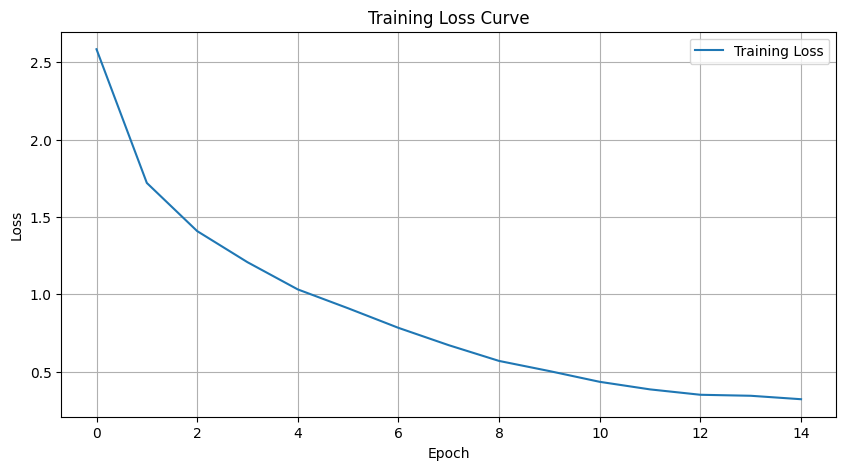

In [62]:
# Plot the loss curve
def natural_sort_key(filename):
    return [int(text) if text.isdigit() else text for text in re.split(r'(\d+)', filename)]

def evaluate_model(model, tokenizer, directory_path, json_path, transform=None, device="cuda"):
    with open(json_path, "r") as f:
        json_data = json.load(f)

    image_filenames = sorted(os.listdir(directory_path), key=natural_sort_key)

    correct_predictions = 0
    total_images = len(image_filenames)

    for idx, filename in enumerate(image_filenames):
        image_path = os.path.join(directory_path, filename)

        img = Image.open(image_path).convert("RGB")

        labels = json_data[idx]["labels"]
        actual_index = json_data[idx]["index"]

        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Image {idx+1}: {filename}")
        plt.show()

        predicted_index = classify(
            model,
            tokenizer,
            img,
            labels,
            transform=transform,
            device=device
        )

        print(f"Predicted: {labels[predicted_index]}, Actual: {labels[actual_index]}")

        if predicted_index == actual_index:
            correct_predictions += 1

    accuracy = (correct_predictions / total_images) * 100
    return accuracy

plt.figure(figsize=(10, 5))
plt.plot(loss_history, label='Training Loss')
plt.title('Training Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

### 🎯 **Task 6: The Grand Finale – Zero-Shot Classification**  

In this final step, the model will attempt its **ultimate trick**: classifying images **without ever seeing labeled examples before.**  

This is where **Zero-Shot Classification** comes into play. Like a mastermind who instantly recognizes a disguise, **ProfessorCLIP** must compare an image against textual class descriptions and pick the most probable match **without explicit training** on the categories.  

### 🏆 Your Task:  
- Design a function to evaluate the model’s capacity for classifying unseen images.  
- Convert textual descriptions into a structured format and refine the image input.  
- Generate distinct feature representations for both text and image.  
- Establish a metric to assess the relationship between the two modalities.  
- Identify the best-aligned category and return the predicted class index.  

With this, the operation reaches its climax. If **ProfessorCLIP** succeeds, it will **outsmart conventional classifiers**, proving that true intelligence needs no labeled examples. **One image. One set of descriptions. One chance.**  

This is the moment of truth. 🃏🔥  


In [63]:
def classify(clip_model: nn.Module,
            tokenizer: Callable[[List[str]], Dict[str, torch.Tensor]],
            img: Image.Image,
            class_descriptions: List[str],
            transform: Optional[Callable[[Image.Image], torch.Tensor]] = None,
            device: str = "cuda") -> int:
    clip_model.eval()

    if transform:
        img_tensor = transform(img).unsqueeze(0).to(device)
    else:
        default_transform = transforms.Compose([
            transforms.Resize((cfg.image_size, cfg.image_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        img_tensor = default_transform(img).unsqueeze(0).to(device)

    encoded_texts = tokenizer(
        class_descriptions,
        padding="max_length",
        truncation=True,
        max_length=cfg.max_length,
        return_tensors="pt"
    )

    input_ids = encoded_texts["input_ids"].to(device)
    attention_mask = encoded_texts["attention_mask"].to(device)

    batch = {
        "image": img_tensor,
        "input_ids": input_ids,
        "attention_mask": attention_mask
    }

    with torch.no_grad():
        outputs = clip_model(batch)

        image_embeddings = outputs["image_embeddings"]
        text_embeddings = outputs["text_embeddings"]

        similarity = torch.matmul(image_embeddings, text_embeddings.T)

        predicted_idx = similarity.argmax(dim=1).item()

    return predicted_idx

### ⚡ **Task 7: Face the Ultimate Test** ⚡  

The machine has spoken. It is time to prove your model’s worth.  

🔹 **Summon the unseen dataset**—a true measure of its learning. This has been provided to you.
🔹 **Feed it to the model** - let it decipher patterns never encountered before.  
🔹 **Gauge its accuracy** - does it stand tall or falter in uncertainty?  

This is the moment of reckoning. Load the test dataset. Let the evaluation begin.  

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


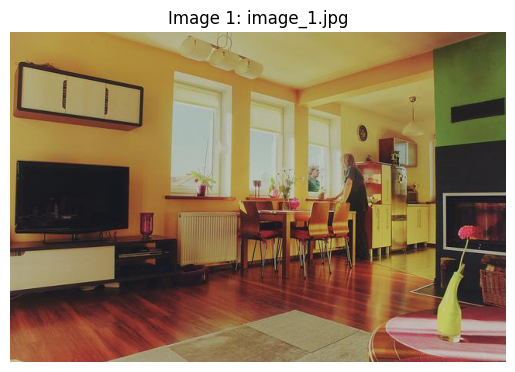

Predicted: a living room, Actual: a living room


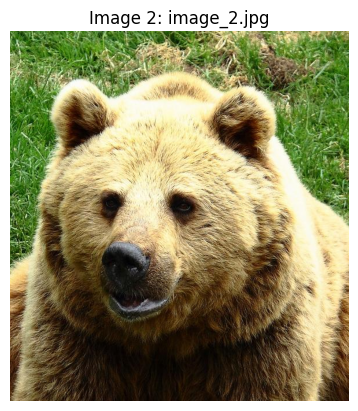

Predicted: a bear, Actual: a bear


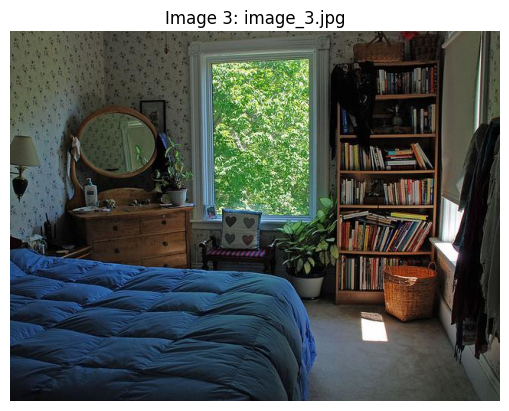

Predicted: a bedroom, Actual: a bedroom


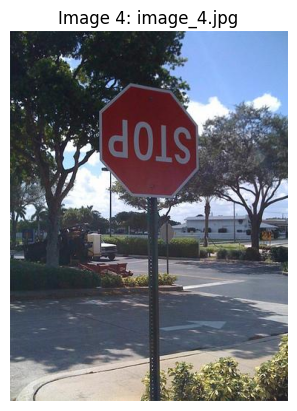

Predicted: a stop sign, Actual: a stop sign


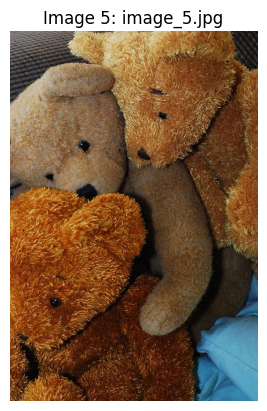

Predicted: food on a table, Actual: teddy bears


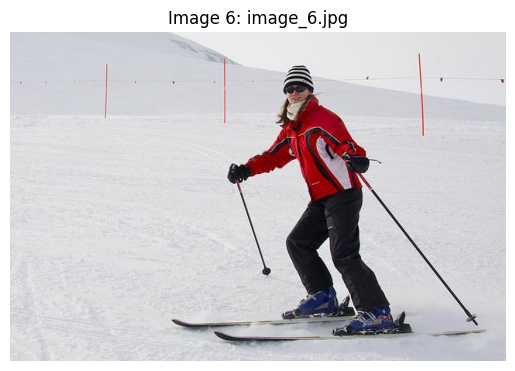

Predicted: woman on ski, Actual: woman on ski


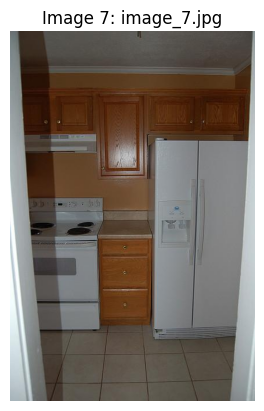

Predicted: a kitchen, Actual: a kitchen


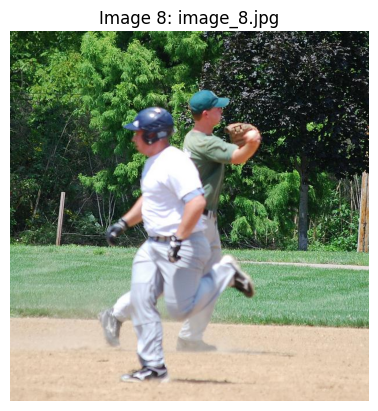

Predicted: baseball players, Actual: baseball players


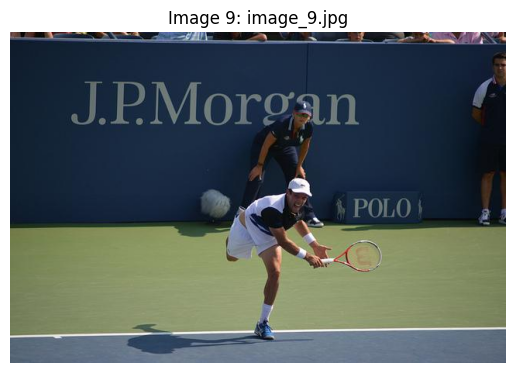

Predicted: tennis player, Actual: tennis player


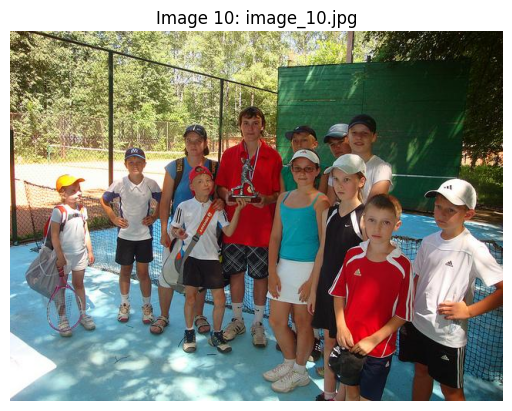

Predicted: children playing sports, Actual: children playing sports


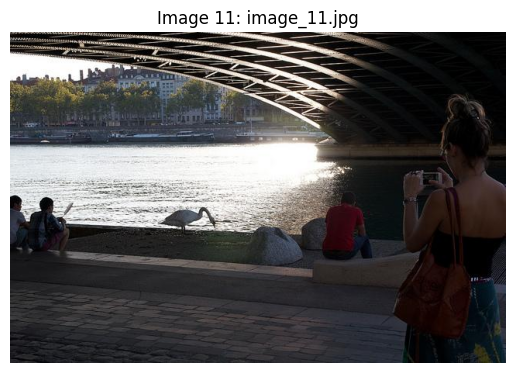

Predicted: a riverside, Actual: a riverside


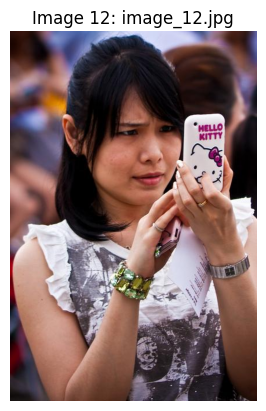

Predicted: woman holding a phone, Actual: woman holding a phone


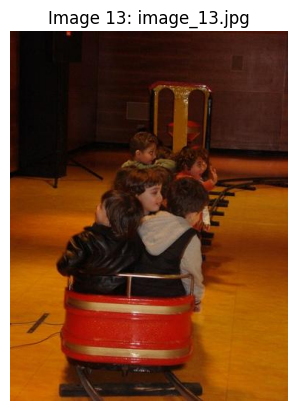

Predicted: kids in a train, Actual: kids in a train


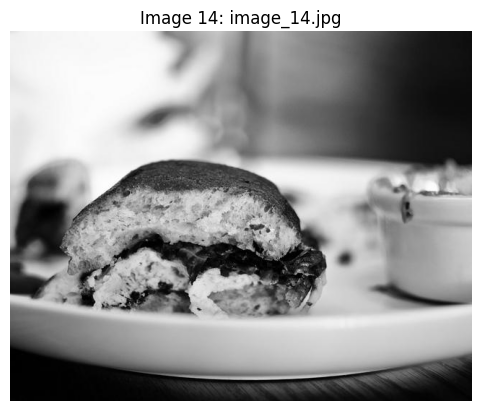

Predicted: a hamburger, Actual: a hamburger


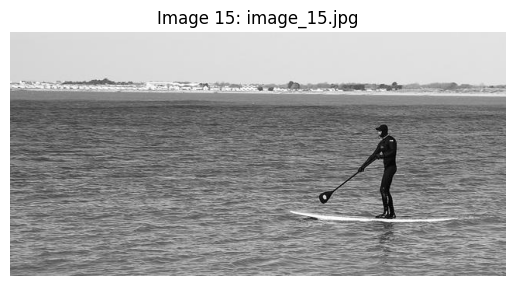

Predicted: a man on a boat, Actual: a man on a boat


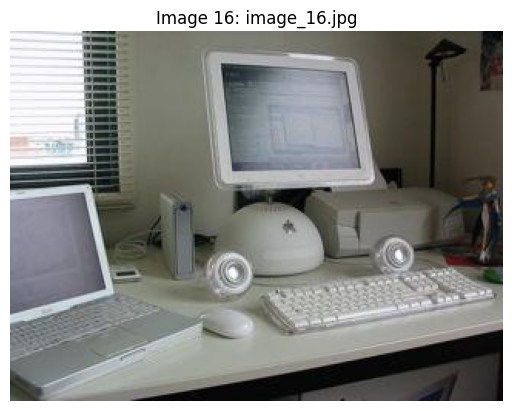

Predicted: woman holding a phone, Actual: a desktop computer


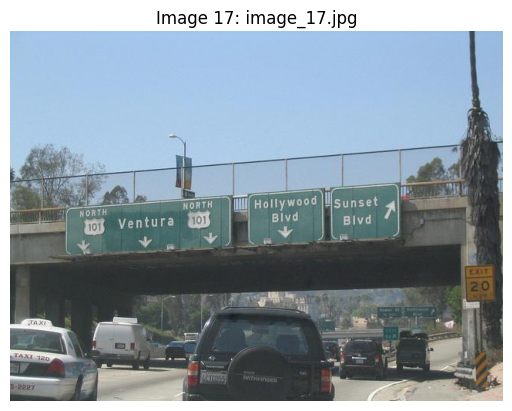

Predicted: highway sign board, Actual: highway sign board


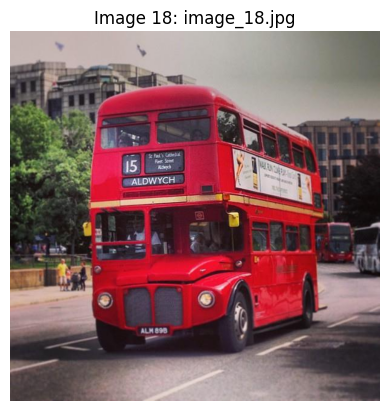

Predicted: double decker bus, Actual: double decker bus


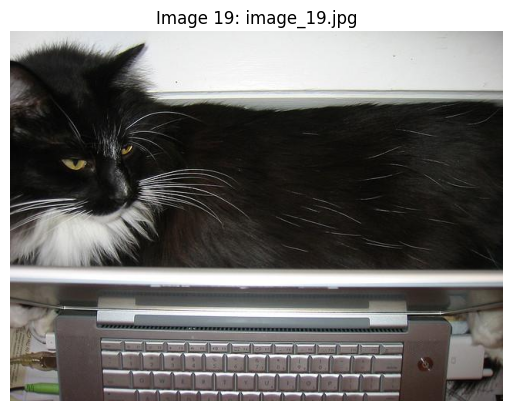

Predicted: cat above laptop, Actual: cat above laptop


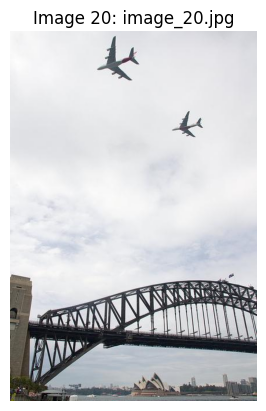

Predicted: aeroplanes over a bridge, Actual: aeroplanes over a bridge


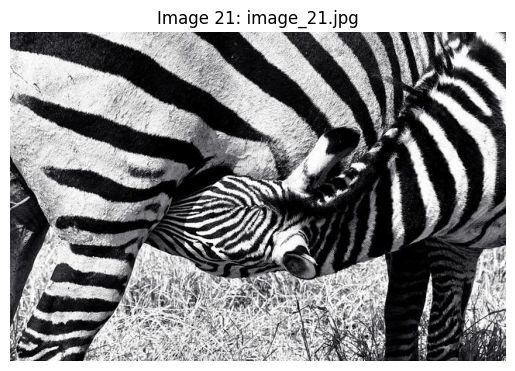

Predicted: a zebra body, Actual: a zebra body


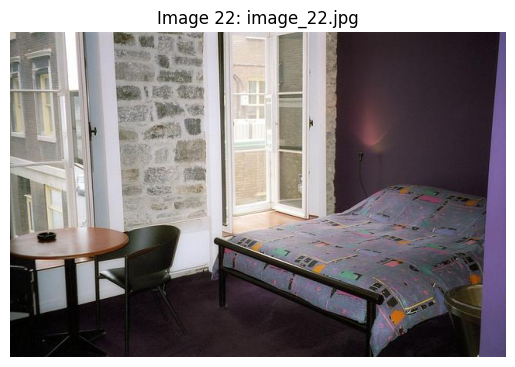

Predicted: a bedroom, Actual: a bedroom


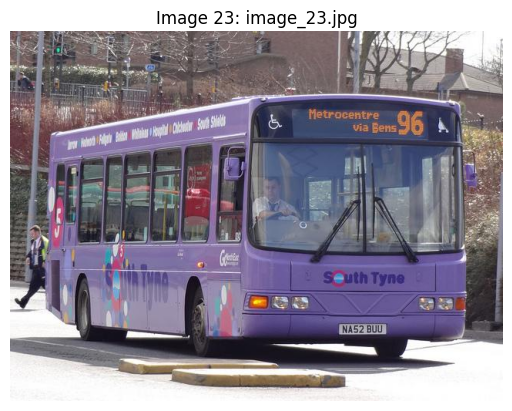

Predicted: a bus, Actual: a bus


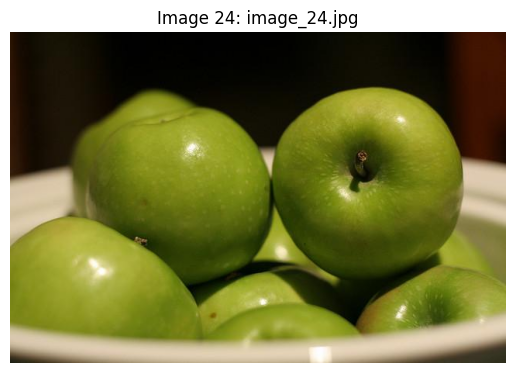

Predicted: green apples, Actual: green apples


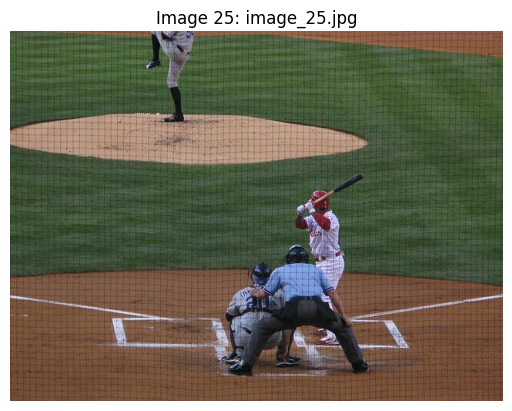

Predicted: a baseball match, Actual: a baseball match


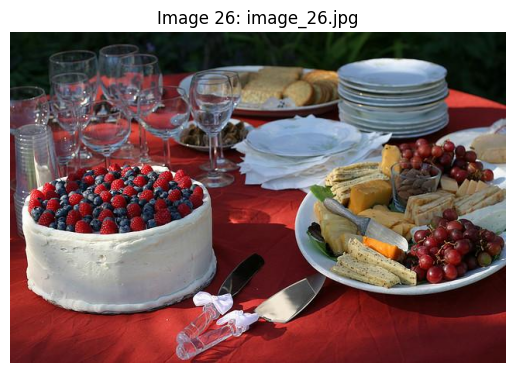

Predicted: food on a table, Actual: food on a table


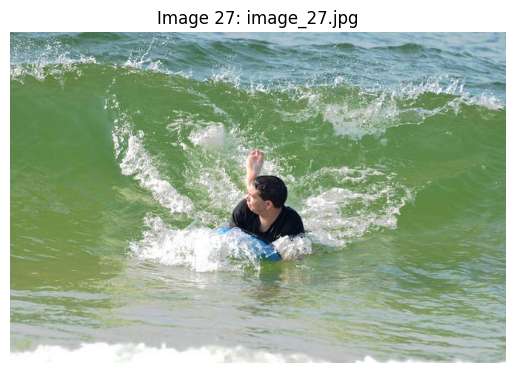

Predicted: man swimming, Actual: man swimming


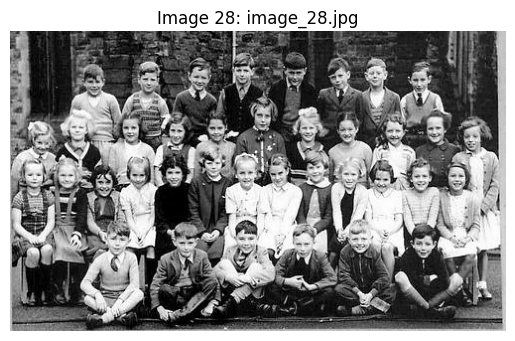

Predicted: food on a table, Actual: a group picture of students


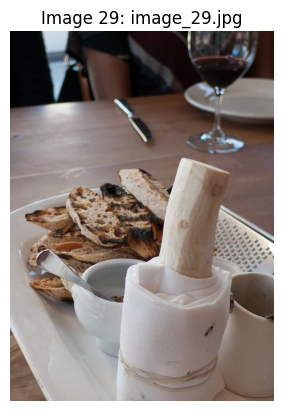

Predicted: a main course dish, Actual: a main course dish


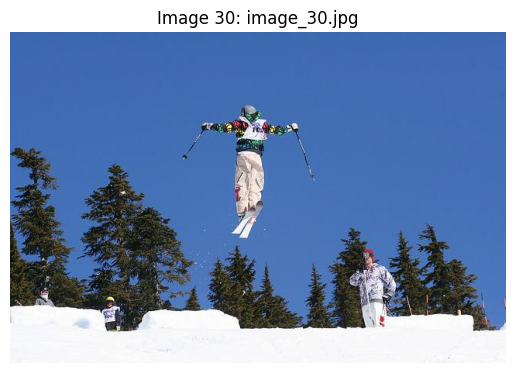

Predicted: a man jumping, Actual: a man jumping


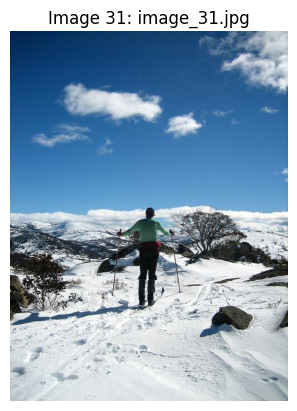

Predicted: woman on ski, Actual: a man in the snow


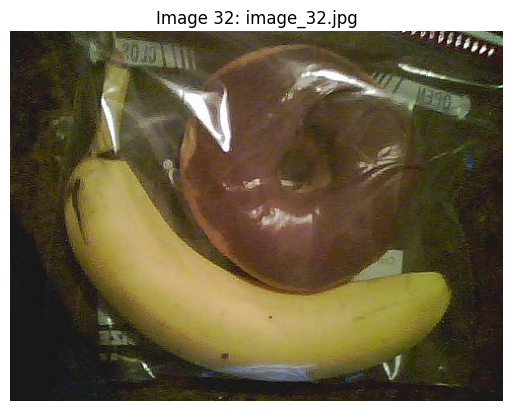

Predicted: mirror selfie, Actual: snack


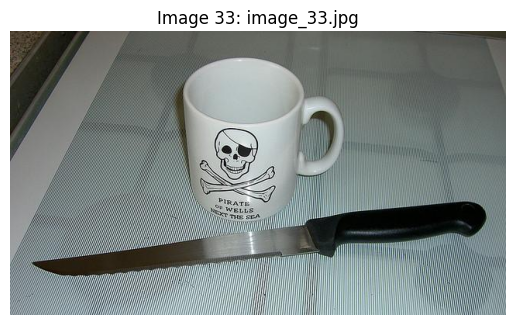

Predicted: highway sign board, Actual: kitchen utensils


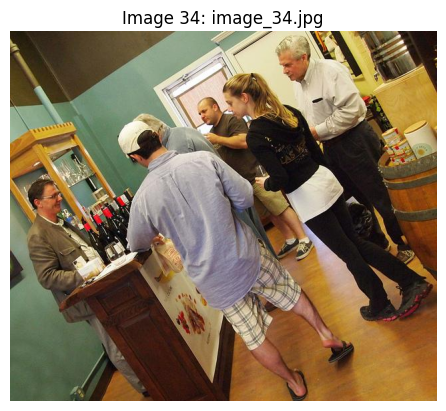

Predicted: people in a bakery, Actual: people in a bakery


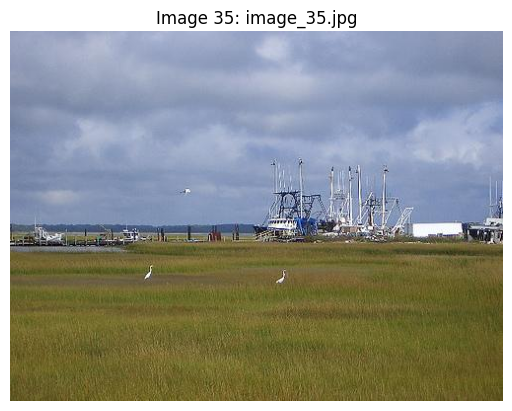

Predicted: a field, Actual: a field


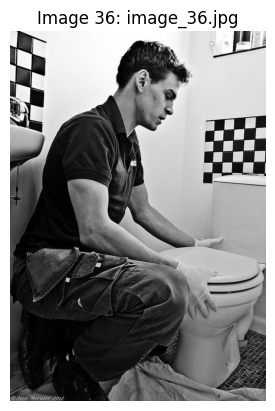

Predicted: man in the toilet, Actual: man in the toilet


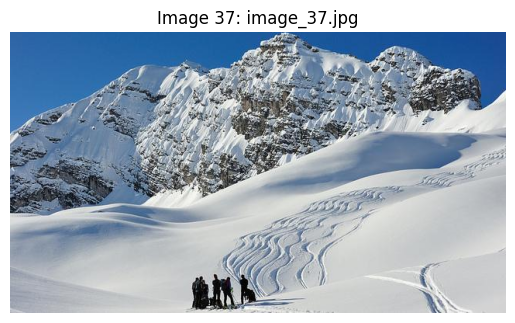

Predicted: snow capped mountain, Actual: snow capped mountain


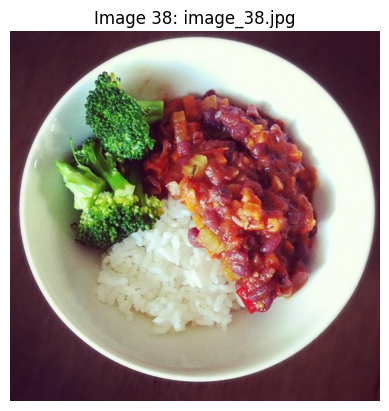

Predicted: salad bowl, Actual: salad bowl


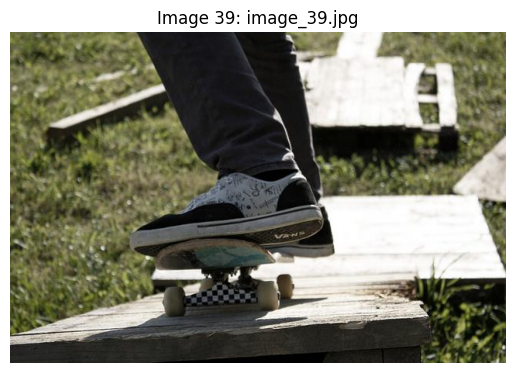

Predicted: man on skateboard, Actual: man on skateboard


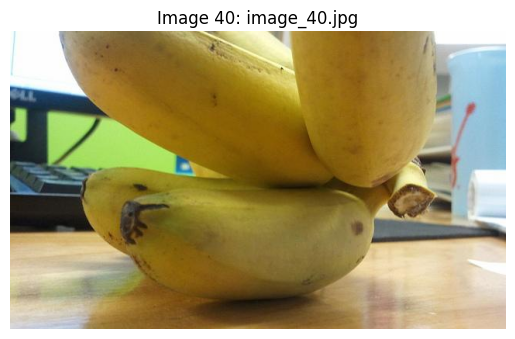

Predicted: a supermarket, Actual: bunch of bananas


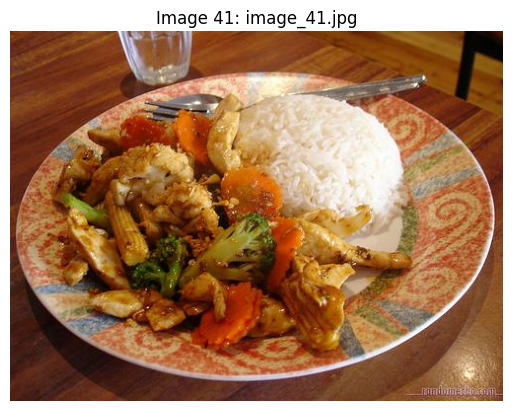

Predicted: lunch plate, Actual: lunch plate


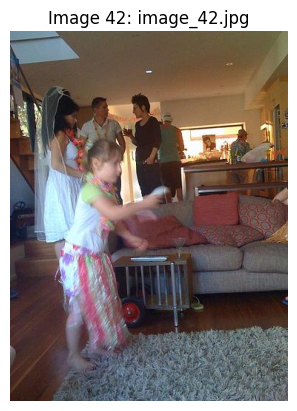

Predicted: people in a room, Actual: people in a room


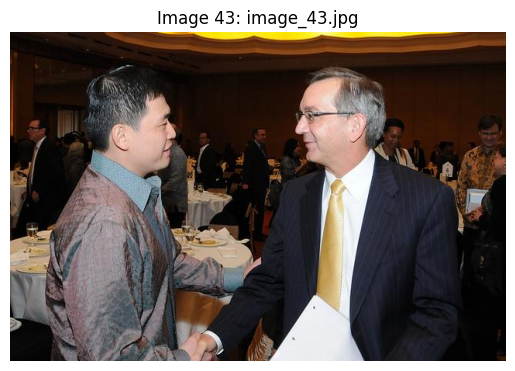

Predicted: men shaking hands, Actual: men shaking hands


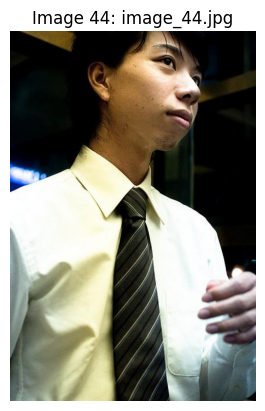

Predicted: man in a tie, Actual: man in a tie


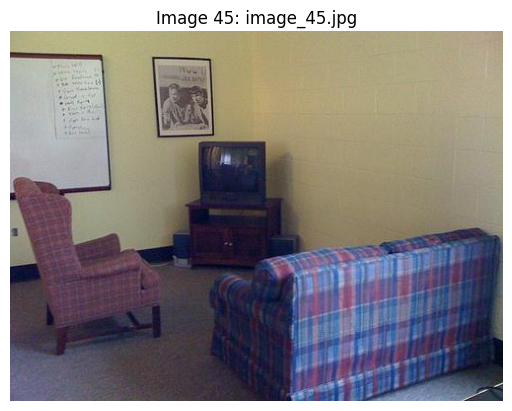

Predicted: a bedroom, Actual: living room


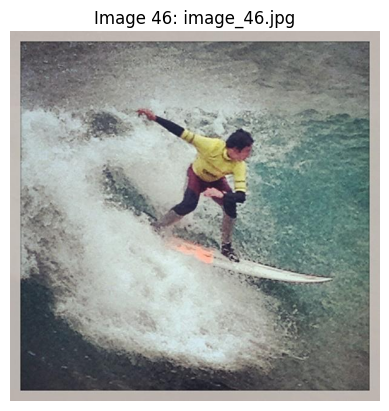

Predicted: surfboarding, Actual: surfboarding


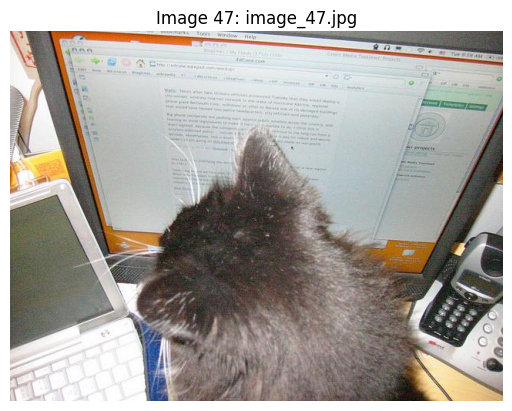

Predicted: cat on desk, Actual: cat on desk


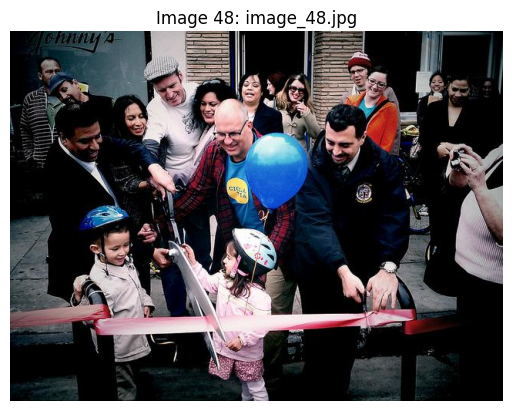

Predicted: birthday celebration, Actual: birthday celebration


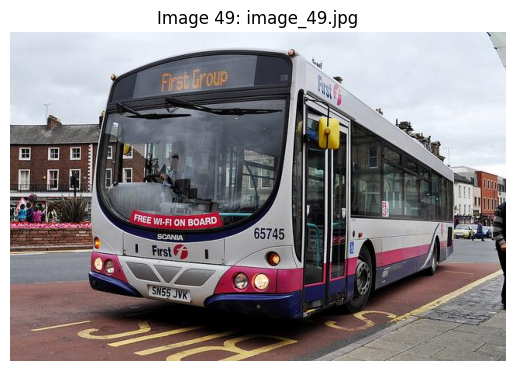

Predicted: a man on a boat, Actual: local bus


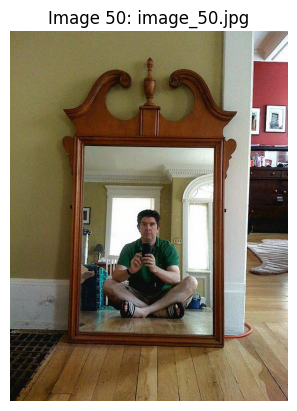

Predicted: mirror selfie, Actual: mirror selfie


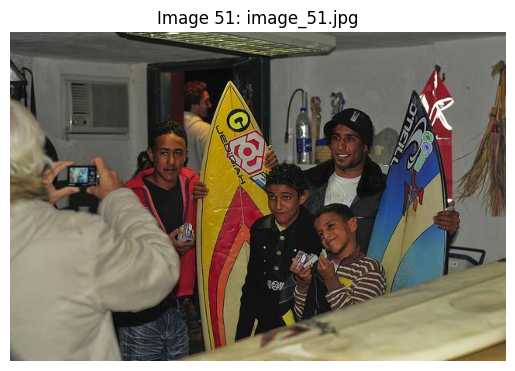

Predicted: men in a shop, Actual: men in a shop


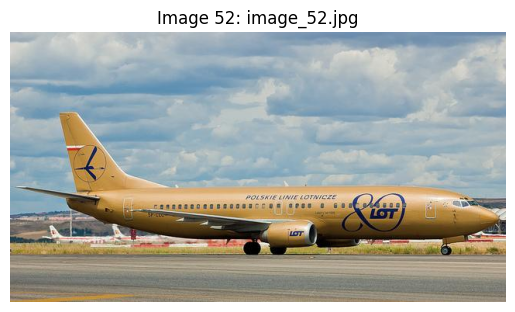

Predicted: an aeroplane, Actual: an aeroplane


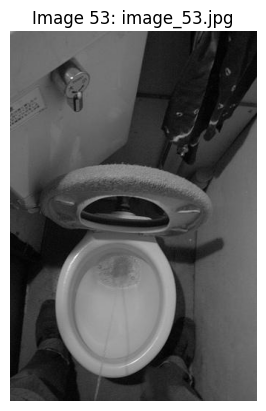

Predicted: a bus, Actual: a commode


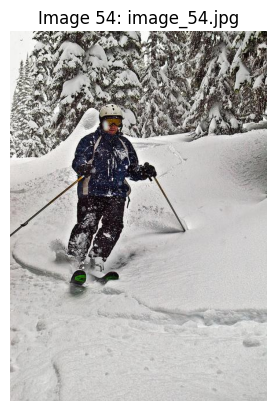

Predicted: a ski diver, Actual: a ski diver


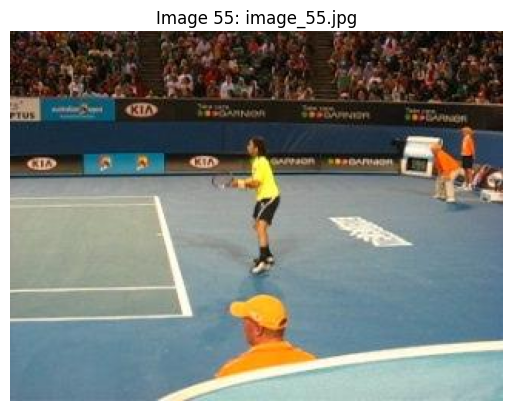

Predicted: a tennis player, Actual: a tennis player


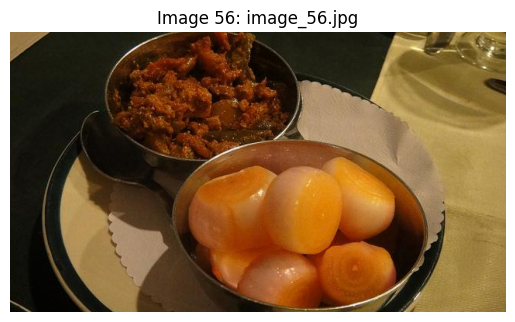

Predicted: a plate of food, Actual: a plate of food


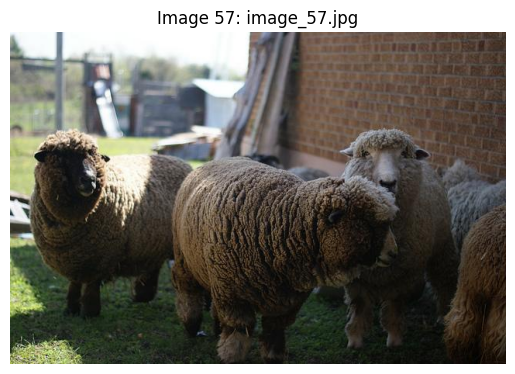

Predicted: a few sheep, Actual: a few sheep


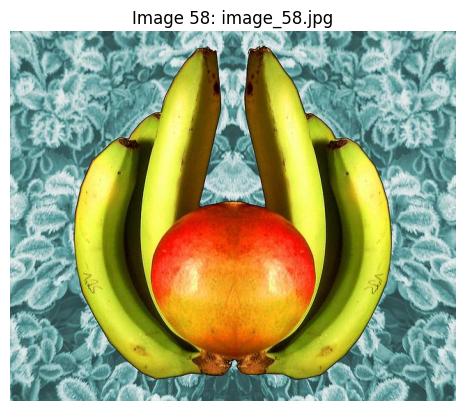

Predicted: a few fruits, Actual: a few fruits


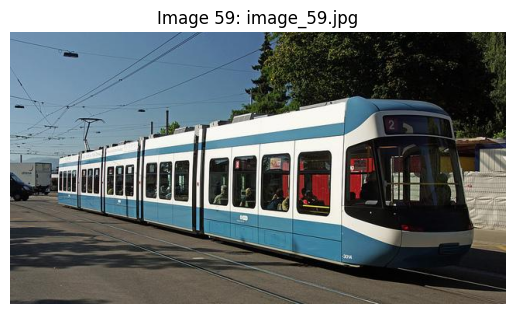

Predicted: a tram, Actual: a tram


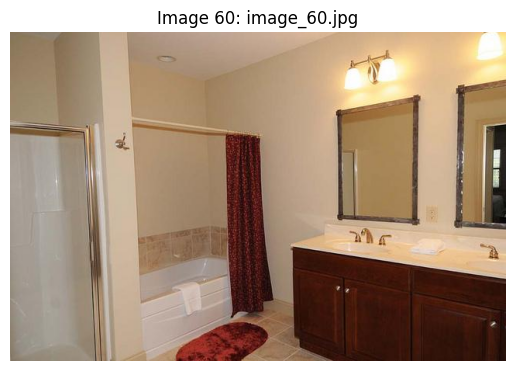

Predicted: a hotel bathroom, Actual: a hotel bathroom
Accuracy: 83.33%


In [64]:
from google.colab import drive
drive.mount('/content/drive')

import re

transform = transforms.Compose([
    transforms.Resize((cfg.image_size, cfg.image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

directory_path = "/data/test_images/"

json_path = "/data/captions.json"

accuracy = evaluate_model(
    model=model,
    tokenizer=tokenizer,
    directory_path=directory_path,
    json_path=json_path,
    transform=transform,
    device=device
)

print(f"Accuracy: {accuracy:.2f}%")


### 🎯 **The Final Verdict: Victory or Defeat?** 🎯  

The time has come to judge your model’s strength. Will it rise to glory or crumble under scrutiny?  

🔹 **Compute the accuracy**—every correct prediction counts.  
🔹 **Compare it to the threshold**—the ultimate challenge.  
🔹 **Decide your fate**—did you conquer, or did the machine defeat you?  

Let the final test begin!  


In [68]:
print(f"Accuracy: {accuracy:.2f}%")

if accuracy >= 85:
    print("🏆 Victory! The machine bows before you. 🏆")
elif accuracy > 83:
    print("it's good enough man cmon, just 1 correct classification away from 85%")
if accuracy < 85:
    print("Accuracy threshold not met. Model needs further training.")

Accuracy: 83.33%
it's good enough man cmon, just 1 correct classification away from 85%
💀 Defeat! The machine remains undefeated. 💀
